# Computational Linear Algebra: PCA Homework

## Initialization:
Fill the missing values in this text box and in the following code-cell.

**Academic Year:** 2024/2025

### Team Members (Alphabetical Order):
1. Morales Condorpocco, Brian Facundo (346581);
2. Spinnicchia, Andrea (344912).

In [158]:
StudentID1 = 346581
StudentID2 = 344912

## Starting Code-Cell 
### Attention: DO NOT CHANGE THE CODE INSIDE THE FOLLOWING CELL!

In [159]:
####################################################################
############## DO NOT CHANGE THE CODE IN THIS CELL #################
####################################################################

import numpy as np

var_entertainment_feat_types = ['Interests', 'Movies', 'Music']
var_personal_feat_types = ['Finance', 'Phobias']
fixed_feat_types = ['Personality', 'Health']

label_types = ['Demographic']

variables_by_type = {
    'Demographics': ['Age', 'Height', 'Weight', 'Number of siblings', 
                     'Gender', 'Hand', 'Education', 'Only child', 'Home Town Type',
                     'Home Type'],
    'Finance': ['Finances', 'Shopping centres', 'Branded clothing', 
                'Entertainment spending', 'Spending on looks', 
                'Spending on gadgets', 'Spending on healthy eating'],
    'Health': ['Smoking', 'Alcohol', 'Healthy eating'],
    'Interests': ['History', 'Psychology', 'Politics', 'Mathematics', 
                  'Physics', 'Internet', 'PC', 'Economy Management', 
                  'Biology', 'Chemistry', 'Reading', 'Geography', 
                  'Foreign languages', 'Medicine', 'Law', 'Cars', 
                  'Art exhibitions', 'Religion', 'Countryside, outdoors', 
                  'Dancing', 'Musical instruments', 'Writing', 'Passive sport', 
                  'Active sport', 'Gardening', 'Celebrities', 'Shopping', 
                  'Science and technology', 'Theatre', 'Fun with friends', 
                  'Adrenaline sports', 'Pets'],
    'Movies': ['Movies', 'Horror', 'Thriller', 'Comedy', 'Romantic', 
               'Sci-fi', 'War', 'Fantasy/Fairy tales', 'Animated', 
               'Documentary', 'Western', 'Action'],
    'Music': ['Music', 'Slow songs or fast songs', 'Dance', 'Folk', 
              'Country', 'Classical music', 'Musical', 'Pop', 'Rock', 
              'Metal or Hardrock', 'Punk', 'Hiphop, Rap', 'Reggae, Ska', 
              'Swing, Jazz', 'Rock n roll', 'Alternative', 'Latino', 
              'Techno, Trance', 'Opera'],
    'Personality': ['Daily events', 'Prioritising workload', 
                    'Writing notes', 'Workaholism', 'Thinking ahead', 
                    'Final judgement', 'Reliability', 'Keeping promises', 
                    'Loss of interest', 'Friends versus money', 'Funniness', 
                    'Fake', 'Criminal damage', 'Decision making', 'Elections', 
                    'Self-criticism', 'Judgment calls', 'Hypochondria', 
                    'Empathy', 'Eating to survive', 'Giving', 
                    'Compassion to animals', 'Borrowed stuff', 
                    'Loneliness', 'Cheating in school', 'Health', 
                    'Changing the past', 'God', 'Dreams', 'Charity', 
                    'Number of friends', 'Punctuality', 'Lying', 'Waiting', 
                    'New environment', 'Mood swings', 'Appearence and gestures', 
                    'Socializing', 'Achievements', 'Responding to a serious letter', 
                    'Children', 'Assertiveness', 'Getting angry', 
                    'Knowing the right people', 'Public speaking', 
                    'Unpopularity', 'Life struggles', 'Happiness in life', 
                    'Energy levels', 'Small - big dogs', 'Personality', 
                    'Finding lost valuables', 'Getting up', 'Interests or hobbies', 
                    "Parents' advice", 'Questionnaires or polls', 'Internet usage'],
    'Phobias': ['Flying', 'Storm', 'Darkness', 'Heights', 'Spiders', 'Snakes', 
                'Rats', 'Ageing', 'Dangerous dogs', 'Fear of public speaking']
}

labels = variables_by_type['Demographics']

try:
    random_seed = min([StudentID1, StudentID2])
except NameError:
    random_seed = StudentID1

def which_featgroups():
    np.random.seed(random_seed)
    these_entertainments = np.random.choice(var_entertainment_feat_types, 2, replace=False).tolist()
    these_personal = np.random.choice(var_personal_feat_types, 1, replace=False).tolist()
    these_types = fixed_feat_types + these_personal + these_entertainments
    print('*** THESE ARE THE SELECTED TYPE OF VARIABLES:')
    for k in these_types:
        print(f'{k}')
    print('*************************************')
    return these_types

def which_features(these_types):
    np.random.seed(random_seed)
    these_features = []
    for type in these_types:
        if type != 'Personality':
            these_features += variables_by_type[type]
        else:
            these_features += np.random.choice(variables_by_type[type], 
                                               int(2 * (len(variables_by_type[type]) / 3)), 
                                               replace=False).tolist()
    print('*** THESE ARE THE SELECTED FEATURES:')
    for ft in these_features:
        print(f'{ft}')
    print('*************************************')
    return these_features

these_types = which_featgroups()
these_features = which_features(these_types)

np.random.seed(random_seed)

*** THESE ARE THE SELECTED TYPE OF VARIABLES:
Personality
Health
Finance
Movies
Music
*************************************
*** THESE ARE THE SELECTED FEATURES:
Hypochondria
Writing notes
Giving
Friends versus money
Loneliness
Parents' advice
Unpopularity
Keeping promises
Knowing the right people
Reliability
Thinking ahead
Energy levels
Final judgement
Achievements
Prioritising workload
Getting up
Number of friends
Charity
Interests or hobbies
Waiting
Funniness
Dreams
Children
Elections
Small - big dogs
Changing the past
Decision making
Cheating in school
Punctuality
Personality
Assertiveness
Borrowed stuff
Self-criticism
Workaholism
Responding to a serious letter
Mood swings
Empathy
Getting angry
Smoking
Alcohol
Healthy eating
Finances
Shopping centres
Branded clothing
Entertainment spending
Spending on looks
Spending on gadgets
Spending on healthy eating
Movies
Horror
Thriller
Comedy
Romantic
Sci-fi
War
Fantasy/Fairy tales
Animated
Documentary
Western
Action
Music
Slow songs or fast 

## Importing Modules

In the following cell, import all the modules you think are necessary for doing the homework, **among the ones listed and used during the laboratories of the course**.
No extra modules are allowed for reproducibility.

In [160]:
# DO NOT IMPORT NUMPY
%matplotlib widget

import pandas as pd
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from IPython.display import display
from matplotlib import cm
from matplotlib.lines import Line2D
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

## Exercise 1. Preparing the Dataset

In the cells below, do the following operations:
1. load the dataset "_responses_hw.csv_";
2. create a working dataframe extracting from _responses_hw.csv_ the columns corresponding to the variables in _these_features_, and randomly selecting 2/3 of the rows. Let us call this dataframe _X_df_;
3. analyze the obtained dataframe and performing cleansing/encoding operations.

In the following cell we loaded the dataset we will use for the homework from the file "_responses_hw.csv_" and displayed it.

In [161]:
responses_path = "responses_hw.csv"

responses_df = pd.read_csv(responses_path)

display(responses_df)

,Music,Slow songs or fast songs,Dance,Folk,Country,Classical music,Musical,Pop,Rock,Metal or Hardrock,...,Age,Height,Weight,Number of siblings,Gender,Hand,Education,Only child,Home Town Type,Home Type
0,5.0,3.0,2.0,1.0,2.0,2.0,1.0,5.0,5.0,1.0,...,20.0,163.0,48.0,1.0,female,right,college/bachelor degree,no,village,block of flats
1,4.0,4.0,2.0,1.0,1.0,1.0,2.0,3.0,5.0,4.0,...,19.0,163.0,58.0,2.0,female,right,college/bachelor degree,no,city,block of flats
2,5.0,5.0,2.0,2.0,3.0,4.0,5.0,3.0,5.0,3.0,...,20.0,176.0,67.0,2.0,female,right,secondary school,no,city,block of flats
3,5.0,3.0,2.0,1.0,1.0,1.0,1.0,2.0,2.0,1.0,...,22.0,172.0,59.0,1.0,female,right,college/bachelor degree,yes,city,house/bungalow
4,5.0,3.0,4.0,3.0,2.0,4.0,3.0,5.0,3.0,1.0,...,20.0,170.0,59.0,1.0,female,right,secondary school,no,village,house/bungalow
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005,5.0,2.0,5.0,2.0,2.0,5.0,4.0,4.0,4.0,3.0,...,20.0,164.0,57.0,1.0,female,right,secondary school,no,city,house/bungalow
1006,4.0,4.0,5.0,1.0,3.0,4.0,1.0,4.0,1.0,1.0,...,27.0,183.0,80.0,5.0,male,left,masters degree,no,village,house/bungalow
1007,4.0,3.0,1.0,1.0,2.0,2.0,2.0,3.0,4.0,1.0,...,18.0,173.0,75.0,0.0,female,right,secondary school,yes,city,block of flats
1008,5.0,3.0,3.0,3.0,1.0,3.0,1.0,3.0,4.0,1.0,...,25.0,173.0,58.0,1.0,female,right,college/bachelor degree,no,city,block of flats


We identified the valid features from the array "_these_features_" and used them to create a new dataframe containing the columns corresponding to the selected variables. Then, we randomly extracted $2/3$ of the dataset and displayed the obtained dataframe.

In [162]:
valid_features = [feature for feature in these_features if feature in responses_df.columns.values]
if not valid_features:
    raise ValueError("No valid features found in the dataset for these_features.")

working_df = responses_df[valid_features]

X_df = working_df.sample(frac=2/3, random_state=0)

display(X_df)

,Hypochondria,Writing notes,Giving,Friends versus money,Loneliness,Parents' advice,Unpopularity,Keeping promises,Knowing the right people,Reliability,...,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
801,1.0,1.0,1.0,4.0,3.0,1.0,3.0,2.0,4.0,4.0,...,3.0,2.0,1.0,1.0,1.0,5.0,3.0,1.0,4.0,1.0
311,1.0,2.0,5.0,2.0,3.0,4.0,5.0,3.0,5.0,5.0,...,2.0,2.0,5.0,5.0,5.0,3.0,3.0,5.0,2.0,5.0
85,3.0,2.0,4.0,4.0,3.0,2.0,5.0,5.0,3.0,4.0,...,4.0,1.0,1.0,1.0,2.0,3.0,3.0,2.0,4.0,3.0
435,1.0,2.0,3.0,3.0,3.0,4.0,3.0,3.0,2.0,4.0,...,5.0,3.0,2.0,1.0,1.0,5.0,3.0,1.0,1.0,1.0
204,3.0,5.0,1.0,2.0,3.0,3.0,1.0,4.0,2.0,4.0,...,4.0,4.0,2.0,5.0,4.0,5.0,4.0,3.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
930,3.0,3.0,5.0,4.0,5.0,3.0,4.0,3.0,3.0,4.0,...,2.0,3.0,5.0,3.0,1.0,1.0,1.0,3.0,3.0,2.0
164,2.0,1.0,2.0,2.0,3.0,4.0,4.0,4.0,4.0,4.0,...,1.0,3.0,2.0,2.0,4.0,4.0,5.0,2.0,3.0,2.0
106,1.0,5.0,4.0,5.0,4.0,3.0,3.0,4.0,3.0,5.0,...,1.0,2.0,4.0,4.0,4.0,5.0,3.0,5.0,3.0,4.0
16,1.0,2.0,3.0,4.0,2.0,3.0,3.0,3.0,4.0,2.0,...,1.0,3.0,2.0,3.0,2.0,3.0,1.0,1.0,4.0,1.0


We printed the informations of the dataframe and checked for missing values in each of its columns, in order to perform cleansing and encoding operations.

In [163]:
print("INFO OF X_df:")
X_df.info()

missing_values = X_df.isnull().sum()
print("\n\nMISSING VALUES IN EACH COLUMN:")
print(missing_values)

INFO OF X_df:
<class 'pandas.core.frame.DataFrame'>
Index: 673 entries, 801 to 575
Data columns (total 79 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Hypochondria                    671 non-null    float64
 1   Writing notes                   671 non-null    float64
 2   Giving                          669 non-null    float64
 3   Friends versus money            669 non-null    float64
 4   Loneliness                      672 non-null    float64
 5   Parents' advice                 671 non-null    float64
 6   Unpopularity                    670 non-null    float64
 7   Keeping promises                672 non-null    float64
 8   Knowing the right people        671 non-null    float64
 9   Reliability                     670 non-null    float64
 10  Thinking ahead                  671 non-null    float64
 11  Energy levels                   670 non-null    float64
 12  Final judgement          

Since we are going to perform PCA, we decided to remove the rows with missing values rather than replacing them, as imputing data could introduce bias and affect clustering results.
Subsequently, we converted all categorical variables into numerical values, using a range from $1$ to $5$ to ensure consistency with the rest of the dataset. This approach was possible because all the categorical values followed a predefined order.

In [164]:
X_df = X_df.dropna()

X_df['Alcohol'] = X_df['Alcohol'].map({'drink a lot':3, 'social drinker':2, 'never':1})
X_df['Smoking'] = X_df['Smoking'].map({'never smoked':1, 'tried smoking':2, 'former smoker':3, 'current smoker':4})
X_df['Punctuality'] = X_df['Punctuality'].map({'early':1, 'on time':2, 'late':3})

display(X_df)

,Hypochondria,Writing notes,Giving,Friends versus money,Loneliness,Parents' advice,Unpopularity,Keeping promises,Knowing the right people,Reliability,...,Metal or Hardrock,Punk,"Hiphop, Rap","Reggae, Ska","Swing, Jazz",Rock n roll,Alternative,Latino,"Techno, Trance",Opera
801,1.0,1.0,1.0,4.0,3.0,1.0,3.0,2.0,4.0,4.0,...,3.0,2.0,1.0,1.0,1.0,5.0,3.0,1.0,4.0,1.0
311,1.0,2.0,5.0,2.0,3.0,4.0,5.0,3.0,5.0,5.0,...,2.0,2.0,5.0,5.0,5.0,3.0,3.0,5.0,2.0,5.0
85,3.0,2.0,4.0,4.0,3.0,2.0,5.0,5.0,3.0,4.0,...,4.0,1.0,1.0,1.0,2.0,3.0,3.0,2.0,4.0,3.0
435,1.0,2.0,3.0,3.0,3.0,4.0,3.0,3.0,2.0,4.0,...,5.0,3.0,2.0,1.0,1.0,5.0,3.0,1.0,1.0,1.0
204,3.0,5.0,1.0,2.0,3.0,3.0,1.0,4.0,2.0,4.0,...,4.0,4.0,2.0,5.0,4.0,5.0,4.0,3.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,2.0,3.0,2.0,3.0,1.0,3.0,3.0,3.0,5.0,2.0,...,2.0,1.0,5.0,3.0,1.0,1.0,1.0,3.0,5.0,1.0
930,3.0,3.0,5.0,4.0,5.0,3.0,4.0,3.0,3.0,4.0,...,2.0,3.0,5.0,3.0,1.0,1.0,1.0,3.0,3.0,2.0
106,1.0,5.0,4.0,5.0,4.0,3.0,3.0,4.0,3.0,5.0,...,1.0,2.0,4.0,4.0,4.0,5.0,3.0,5.0,3.0,4.0
16,1.0,2.0,3.0,4.0,2.0,3.0,3.0,3.0,4.0,2.0,...,1.0,3.0,2.0,3.0,2.0,3.0,1.0,1.0,4.0,1.0


## Exercise 2. Analyzing the Variance and the PCs

In the cells below, do the following operations:
1. create two new dataframes from _X_df_ applying a StandardScaler and a MinMaxscaler. Call these new dataframes as _Xstd_df_ and _Xmm_df_, respectively;
2. compute the variance of all the features in _X_df_, _Xstd_df_, and _Xmm_df_ and **comment the results**;
3. compute all the $n$ Principal Components (PCs) for each dataset _X_df_, _Xstd_df_, and _Xmm_df_. Then, visualize the curves of the cumulative explained variances and **comment the results**.

In the following cell we created two new dataframes, applying a StandardScaler and a MinMaxscaler to the recently obtained dataset.

In [165]:
scaler_std = StandardScaler()
scaler_std.fit(X_df)

Xstd_df = scaler_std.transform(X_df)
labelStandard = "Standard Scaled dataset"

scaler_mm = MinMaxScaler()
scaler_mm.fit(X_df)

Xmm_df = scaler_mm.transform(X_df)
labelMinMax = "MinMax Scaled dataset"

Then, we computed the variance of all the features in the three dataframes.
- The variances of the original dataset range between $1$ and $2$ and they are relatively uniform. This is because all the variables are distributed within the same range of $1$ to $5$.
- The variances of the dataset transformed with the Standard Scaler are all equal to $1$. This result is expected, as the scaler standardizes data to achieve a mean of $0$ and a variance of $1$.
- The variances of the dataset transformed with the MinMax Scaler are between $0$ and $1$, significantly lower than those in the original dataset.

In [166]:
variance_df = pd.DataFrame(np.var(X_df, axis=0), columns= ['Original'])
variance_df['Standard Scaler'] = np.var(Xstd_df, axis=0)
variance_df['MinMax Scaler'] = np.var(Xmm_df, axis=0)

display(variance_df)

,Original,Standard Scaler,MinMax Scaler
Hypochondria,1.250146,1.0,0.078134
Writing notes,2.102145,1.0,0.131384
Giving,1.751060,1.0,0.109441
Friends versus money,1.198684,1.0,0.074918
Loneliness,1.202251,1.0,0.075141
...,...,...,...
Rock n roll,1.570939,1.0,0.098184
Alternative,1.757846,1.0,0.109865
Latino,1.747958,1.0,0.109247
"Techno, Trance",1.701812,1.0,0.106363


We created a function that, given a dataset, performs the PCA and plots the curve of the cumulative explained variance. Then, we used this function for all three datasets (_X_df_, _Xstd_df_, _Xmm_df_)

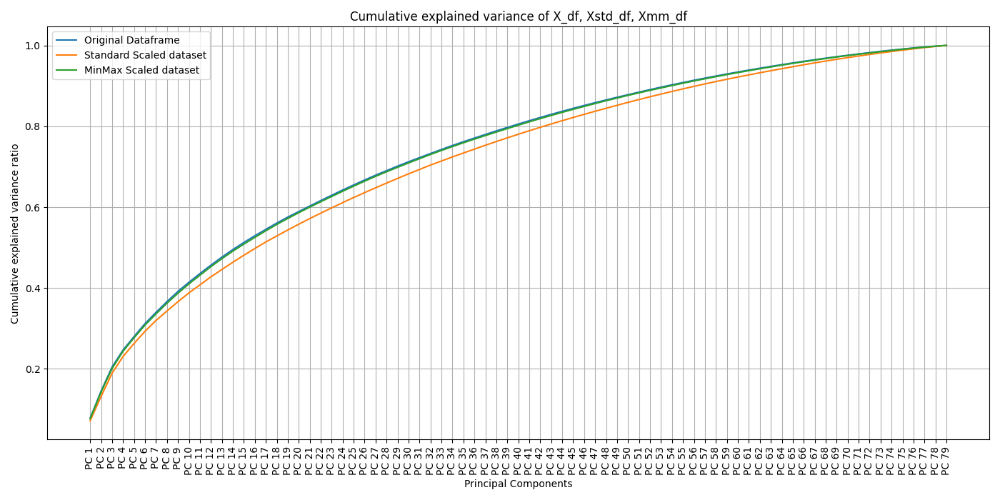

In [167]:
def compute_pca_and_plot(X, label):
    pca = PCA()
    pca.fit(X)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

    plt.plot(cumulative_variance, label=label)
    plt.xticks(ticks=np.arange(pca.n_features_in_), labels=[f'PC {x+1}' for x in range(pca.n_features_in_)], rotation=90)
    plt.xlabel('Principal Components')
    plt.ylabel('Cumulative explained variance ratio')
    plt.title('Cumulative explained variance of X_df, Xstd_df, Xmm_df')
    plt.grid()

    return cumulative_variance

plt.figure(figsize=(14, 7))
cum_var_X = compute_pca_and_plot(X_df, "Original Dataframe")
cum_var_Xstd = compute_pca_and_plot(Xstd_df, labelStandard)
cum_var_Xmm = compute_pca_and_plot(Xmm_df, labelMinMax)

plt.legend()
plt.tight_layout()
plt.show()

## Exercise 3. Dimensionality Reduction and PC Interpretation

In the cells below, do the following operations:
1. For each one of the two dataframes _Xstd_df_, and _Xmm_df_, compute a new PCA for performing a dimensionality reduction with respect to $m$ dimensions. The value of $m$ must be $$m = \min\{m', 5\}\,,$$ where $m'$ is the value required for obtaining $33\%$ of the total variance.
2. For both the cases, visualize all the PCs and give a name/interpretation to them. **Comment and motivate your interpretations**. If possible, **compare the differences among the results obtained** for _Xstd_df_ and _Xmm_df_.
3. Perform the score graph for both the cases (_std_ and _mm_). If $m>3$, plot the score graph with respect to the first 3 PCs. All the **plots must show the names of the PCs on the axes** for better understanding the results.
4. **Optional:** plot more score graphs, coloring the dots with respect to any label in the list _labels_ that you believe can be interesting. **Comment and analyze this optional plots**.

In the next cell, we created a function to find the value of $m$ for the two scaled dataframes and to perform the dimensionality reduction with a number of Principal Components equal to $m$. For both of them, the value required to obtain $33\%$ of the total variance is larger than $5$, therefore we selected $m=5$.

In [168]:
def reduce_to_m_dimensions(X, cumulative_variance, target_variance=0.33, max_components=5):
    m_prime = np.searchsorted(cumulative_variance, target_variance) + 1
    
    m = min(m_prime, max_components)

    pca_reduction = PCA(n_components=m)
    Y_reduced = pca_reduction.fit_transform(X)
    
    return m, Y_reduced, pca_reduction

m_std, Ystd_reduced, pca_std = reduce_to_m_dimensions(Xstd_df, cum_var_Xstd)
m_mm, Ymm_reduced, pca_mm = reduce_to_m_dimensions(Xmm_df, cum_var_Xmm)

In this cell we defined a map of colors for each type of the list "_these_types_", useful for the visualization of the contributes of the features for each PC.

In [169]:
set3 = cm.Set3.colors

colorType = {t: set3[i] for i, t in enumerate(these_types)}

colorFeature = {}

for t in variables_by_type:
    for column in these_features:
        if column in variables_by_type[t]:
            colorFeature[column] = colorType[t]

This function plots the contribution of every feature colored by type for each PC. We defined a threshold $\epsilon = \sqrt{1/n}\cdot1.4$ (where $n$ is the number of features), to find which features have the greatest positive and negative contributes with respect to the threshold.

In [170]:
def interpret(pca, m, label):
    eps = np.sqrt(1 / pca.n_features_in_)*1.4

    featureListColor = [colorFeature[f] for f in these_features]

    type_colors_legend = [Line2D([0], [0], color=colorType[k]) for k in colorType.keys()]
    
    for ii in range(m):
        plt.figure(figsize=(14, 7))
        plt.bar(np.arange(pca.n_features_in_), pca.components_[ii,:], color=featureListColor)

        plt.plot([-0.5, pca.n_features_in_ - 0.5], [eps, eps], 'red')
        plt.plot([-0.5, pca.n_features_in_ - 0.5], [-eps, -eps], 'red')

        plt.xticks(ticks=np.arange(pca.n_features_in_), labels=these_features, rotation=90, fontsize=7)
        plt.title(f"{label}: Features (colored by type) - PC {ii+1}")
        plt.legend(type_colors_legend,[k for k in colorType.keys()])
        plt.grid()
        plt.tight_layout()
        plt.show()
        
        ind_great_pos_PCii = np.argwhere(pca.components_[ii, :] >= eps).flatten()
        ind_great_neg_PCii = np.argwhere(pca.components_[ii, :] <= -eps).flatten()
        
        great_pos_PCii = [these_features[i] for i in ind_great_pos_PCii]
        great_neg_PCii = [these_features[i] for i in ind_great_neg_PCii]    
            
        print('HIGH-VALUED POSITIVE COMPONENTS:')
        print(great_pos_PCii)  
        print('\nHIGH-VALUED NEGATIVE COMPONENTS:')
        print(great_neg_PCii)

**STANDARD SCALER DATASET**

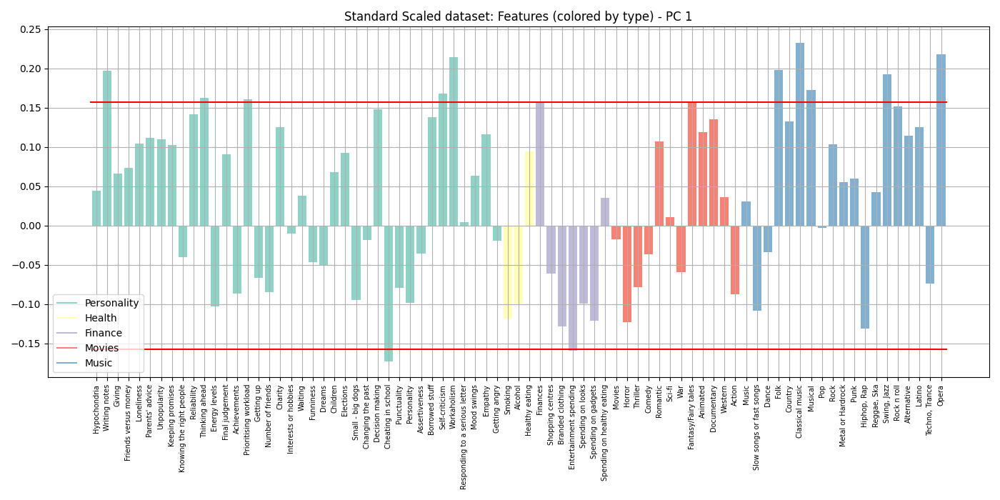

HIGH-VALUED POSITIVE COMPONENTS:
['Writing notes', 'Thinking ahead', 'Prioritising workload', 'Self-criticism', 'Workaholism', 'Finances', 'Folk', 'Classical music', 'Musical', 'Swing, Jazz', 'Opera']

HIGH-VALUED NEGATIVE COMPONENTS:
['Cheating in school', 'Entertainment spending']


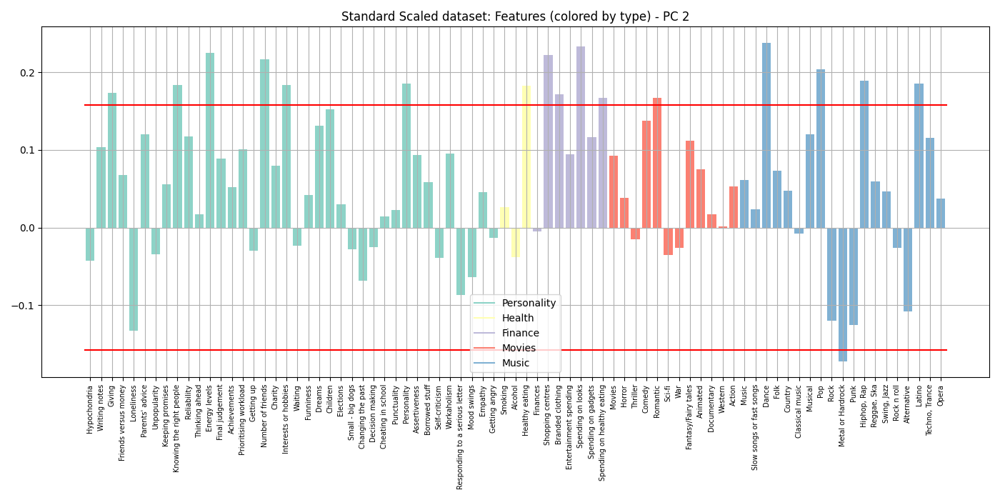

HIGH-VALUED POSITIVE COMPONENTS:
['Giving', 'Knowing the right people', 'Energy levels', 'Number of friends', 'Interests or hobbies', 'Personality', 'Healthy eating', 'Shopping centres', 'Branded clothing', 'Spending on looks', 'Spending on healthy eating', 'Romantic', 'Dance', 'Pop', 'Hiphop, Rap', 'Latino']

HIGH-VALUED NEGATIVE COMPONENTS:
['Metal or Hardrock']


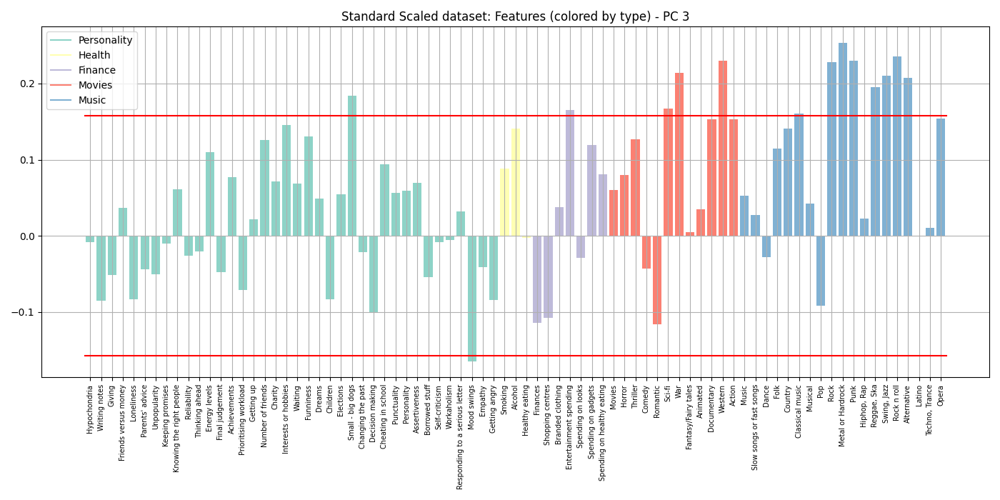

HIGH-VALUED POSITIVE COMPONENTS:
['Small - big dogs', 'Entertainment spending', 'Sci-fi', 'War', 'Western', 'Classical music', 'Rock', 'Metal or Hardrock', 'Punk', 'Reggae, Ska', 'Swing, Jazz', 'Rock n roll', 'Alternative']

HIGH-VALUED NEGATIVE COMPONENTS:
['Mood swings']


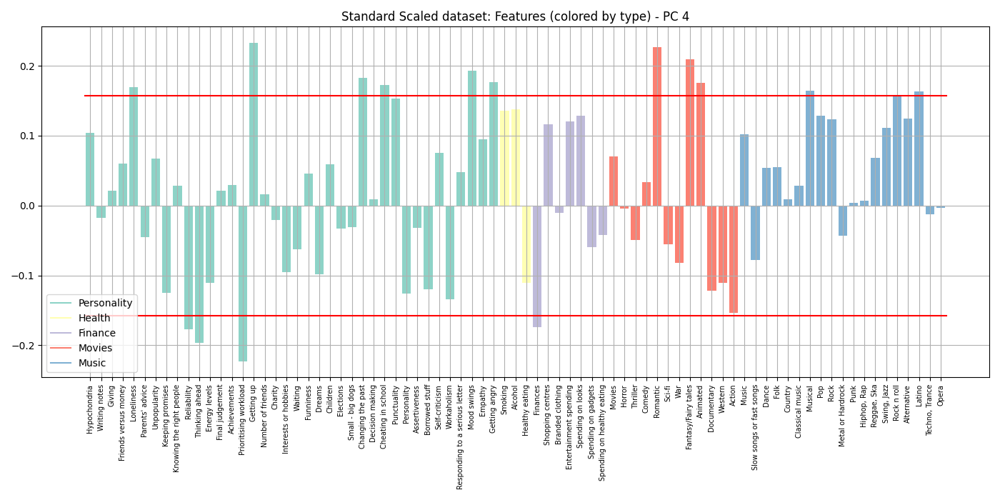

HIGH-VALUED POSITIVE COMPONENTS:
['Loneliness', 'Getting up', 'Changing the past', 'Cheating in school', 'Mood swings', 'Getting angry', 'Romantic', 'Fantasy/Fairy tales', 'Animated', 'Musical', 'Latino']

HIGH-VALUED NEGATIVE COMPONENTS:
['Reliability', 'Thinking ahead', 'Prioritising workload', 'Finances']


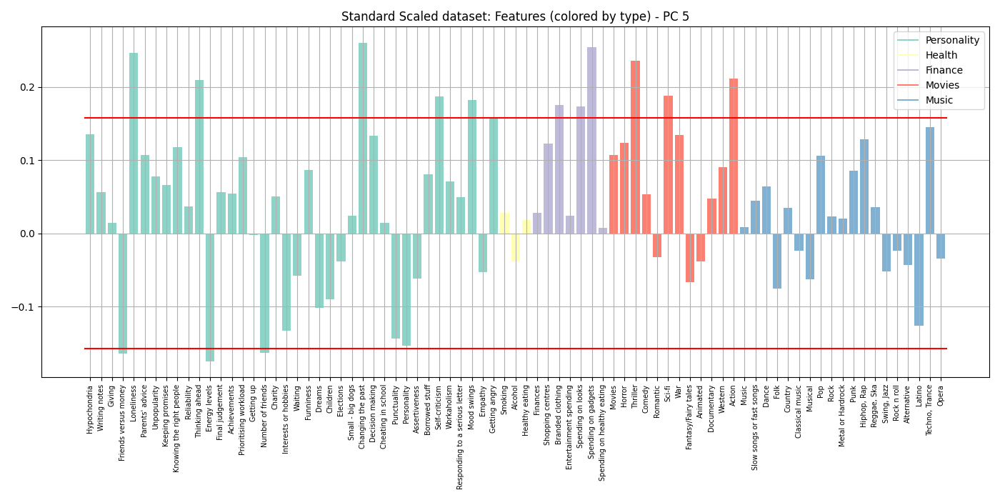

HIGH-VALUED POSITIVE COMPONENTS:
['Loneliness', 'Thinking ahead', 'Changing the past', 'Self-criticism', 'Mood swings', 'Branded clothing', 'Spending on looks', 'Spending on gadgets', 'Thriller', 'Sci-fi', 'Action']

HIGH-VALUED NEGATIVE COMPONENTS:
['Friends versus money', 'Energy levels', 'Number of friends']


In [171]:
interpret(pca_std, m_std, labelStandard)

- **_PC 1_**: The first component highlights individuals who are **disciplined** and **conscientious**, showing a strong sense of responsibility and attention to detail.
- **_PC 2_**: This component is characterized by **charisma** and **style**, with a blend of features that emphasize their ability to socialize and their charm.
- **_PC 3_**: The third component represents an **eclectic** personality combined with **emotional stability**, with several features relative to music and movies.
- **_PC 4_**: This component reveals traits of **impulsiveness** and **unreliability**, driven by features that suggest quick and instinctive behavior.
- **_PC 5_**: The last component highlights individuals who are both **introspective** and **materialistic**, with features related to self-reflection and material possessions.

In [172]:
pc_std_names =  ["Discipline and Integrity",
             "Charisma and Stylishness",
             "Eclecticism (+) vs Stability (-)",
             "Expressiveness (+) vs Discipline (-)",
             "Loneliness and Materialism"]

**MINMAX SCALER DATASET**

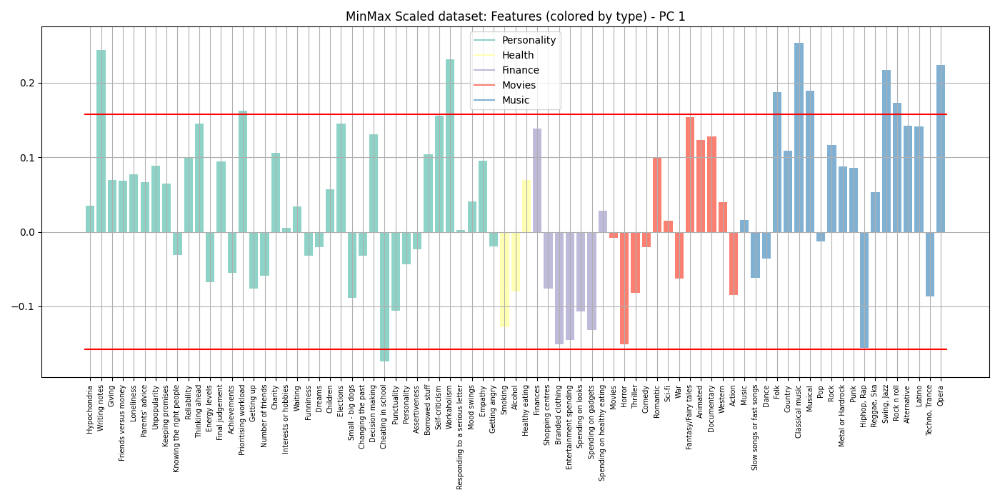

HIGH-VALUED POSITIVE COMPONENTS:
['Writing notes', 'Prioritising workload', 'Workaholism', 'Folk', 'Classical music', 'Musical', 'Swing, Jazz', 'Rock n roll', 'Opera']

HIGH-VALUED NEGATIVE COMPONENTS:
['Cheating in school']


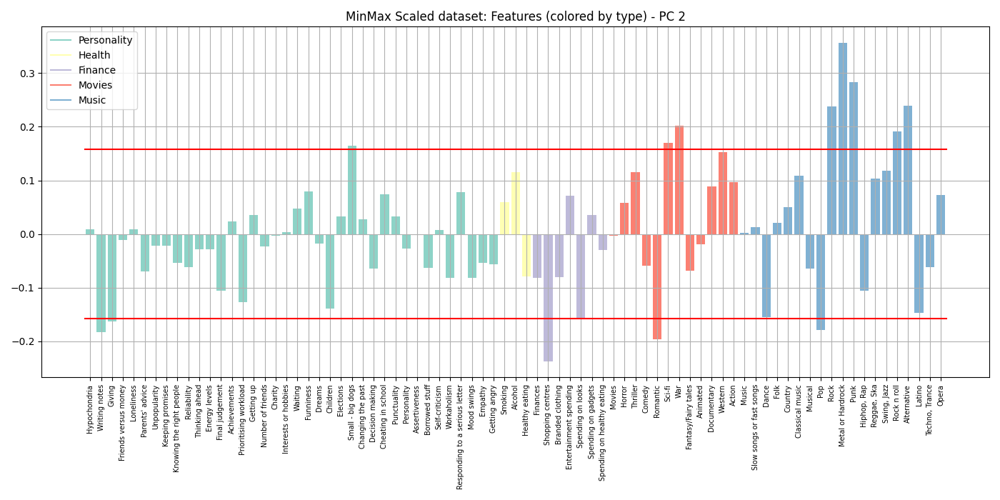

HIGH-VALUED POSITIVE COMPONENTS:
['Small - big dogs', 'Sci-fi', 'War', 'Rock', 'Metal or Hardrock', 'Punk', 'Rock n roll', 'Alternative']

HIGH-VALUED NEGATIVE COMPONENTS:
['Writing notes', 'Giving', 'Shopping centres', 'Romantic', 'Pop']


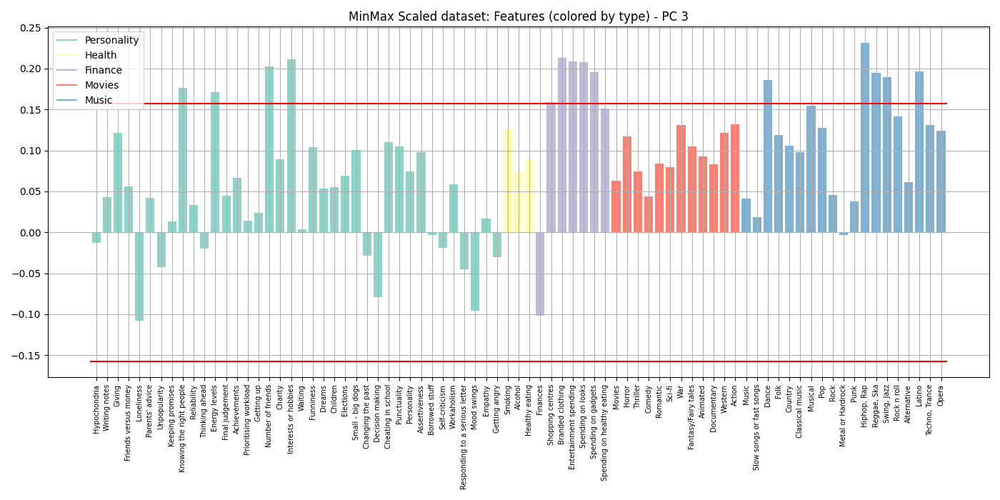

HIGH-VALUED POSITIVE COMPONENTS:
['Knowing the right people', 'Energy levels', 'Number of friends', 'Interests or hobbies', 'Shopping centres', 'Branded clothing', 'Entertainment spending', 'Spending on looks', 'Spending on gadgets', 'Dance', 'Hiphop, Rap', 'Reggae, Ska', 'Swing, Jazz', 'Latino']

HIGH-VALUED NEGATIVE COMPONENTS:
[]


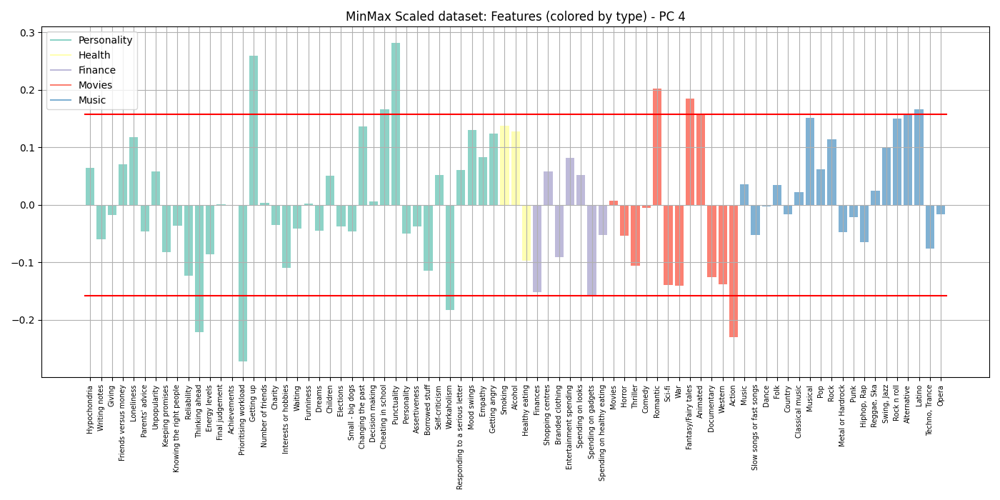

HIGH-VALUED POSITIVE COMPONENTS:
['Getting up', 'Cheating in school', 'Punctuality', 'Romantic', 'Fantasy/Fairy tales', 'Animated', 'Alternative', 'Latino']

HIGH-VALUED NEGATIVE COMPONENTS:
['Thinking ahead', 'Prioritising workload', 'Workaholism', 'Spending on gadgets', 'Action']


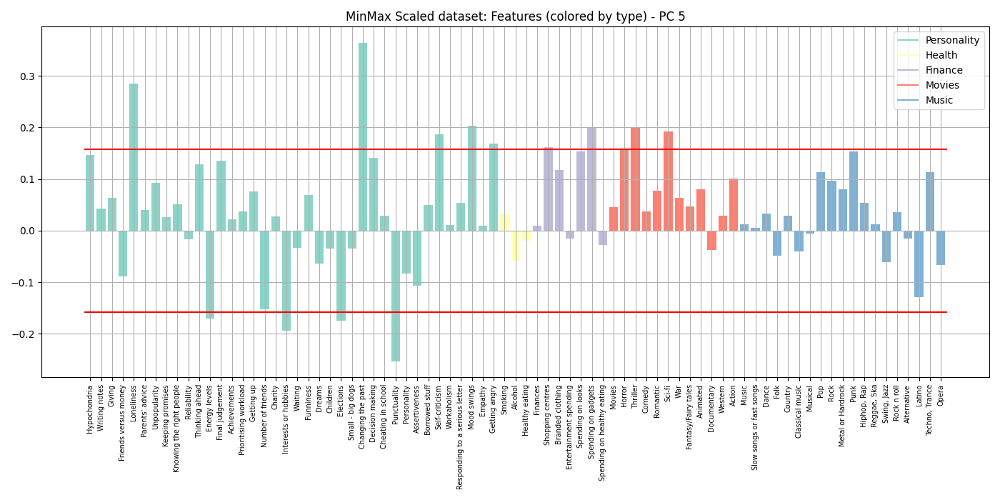

HIGH-VALUED POSITIVE COMPONENTS:
['Loneliness', 'Changing the past', 'Self-criticism', 'Mood swings', 'Getting angry', 'Shopping centres', 'Spending on gadgets', 'Horror', 'Thriller', 'Sci-fi']

HIGH-VALUED NEGATIVE COMPONENTS:
['Energy levels', 'Interests or hobbies', 'Elections', 'Punctuality']


In [173]:
interpret(pca_mm, m_mm, labelMinMax)

- **_PC 1_**: The first component reflects individuals who are **work-oriented** and **intellectual**, with traits of self-criticism and forward-thinking and a refined taste in music.
- **_PC 2_**: The second component describes individuals that are **alternative** and **tough**, as their preferences lean towards bold and unconventional pursuits.
- **_PC 3_**: This component reflects an individual who is **social** and **energetic**, with a strong focus on personal style and entertainment.
- **_PC 4_**: This component is characterized by **punctuality** but **lack of discipline**, with features that suggest interests in creative and expressive media.
- **_PC 5_**: The last component reveals emotional complexity, characterized by traits of **negativity**, struggles with motivation and **disorganization**.

In [174]:
pc_mm_names =  ["Perfectionism and Sophistication",
             "Rebelliousness (+) vs Sentimentality (-)",
             "Sociability and Expressiveness (+)",
             "Punctuality (+) vs Discipline (-)",
             "Loneliness and Low energy"]

Here we plot the $3D$ score graphs for both the datasets. The three dimensions are derived from the first three Principal Components out of the five we analyzed earlier.

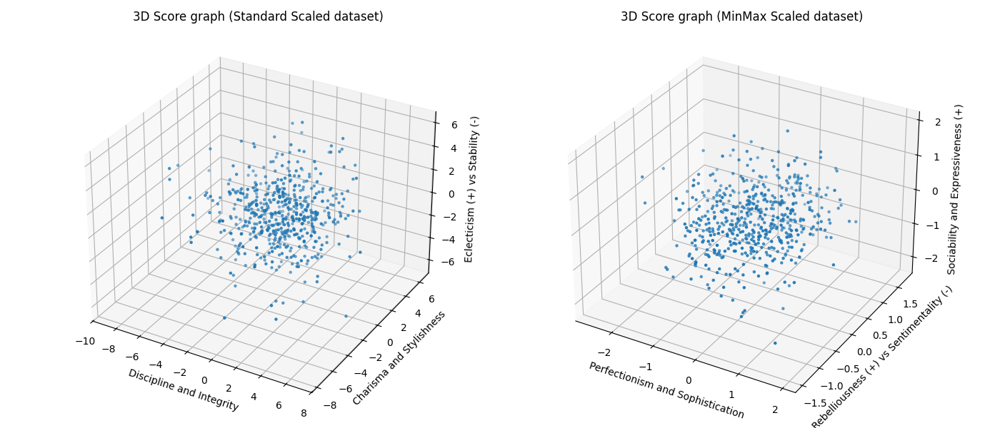

In [175]:
def plot_score_graphs(ax, Y_reduced, pc_names, label):
    ax.scatter(Y_reduced[:, 0], Y_reduced[:, 1], Y_reduced[:, 2], s=5)
    ax.set_title(f'3D Score graph ({label})')
    ax.set_xlabel(pc_names[0])
    ax.set_ylabel(pc_names[1])
    ax.set_zlabel(pc_names[2])
    ax.grid()

fig = plt.figure(figsize=(14, 6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

plot_score_graphs(ax1, Ystd_reduced, pc_std_names, labelStandard)
plot_score_graphs(ax2, Ymm_reduced, pc_mm_names, labelMinMax)

plt.tight_layout()
plt.show()

In the following cell we defined a function that divides an array of numerical values into a specified number of evenly distributed groups and ensures that the full range of values is covered. This function will be useful in the visualization of the score graphs, as each group will be assigned a distinct color, improving clarity and interpretability.

In [176]:
def group_array(array, target_groups=5):
    array = array[~np.isnan(array)]

    array_min = np.min(array)
    array_max = np.max(array)
    
    bins = np.linspace(array_min, array_max, target_groups +1 ,dtype=int)

    grouped_array = [f"{int(bins[i])}-{int(bins[i+1] - 1)}" for i in range(len(bins)-1)]
    grouped_array[-1] = grouped_array[-1].split("-")[0] + f"-{int(array_max)}"

    return grouped_array

This code creates a dictionary that assigns a color to each group of values for a label. For example, for the label _"Age"_, a single color is assigned to the range of values from $15$ to $17$, a different color to the range from $18$ to $20$, and so on. Additionally, a default color is assigned for unspecified values. This process is repeated for all labels in the dataframe.

In [177]:
set1 = cm.Set1.colors

label_color_dict = {}
legend_colors = []
label_dict = {}

for label in labels:
    label_values = responses_df.loc[X_df.index, label].unique()
    if label_values.dtype == np.float64:
        label_values = group_array(label_values)
        colorType = {v: set1[i] for i, v in enumerate(label_values)}
        colorType['Not specified'] = (128 / 255, 128 / 255, 128 / 255, 1)
        legend_colors.append(colorType)
        expanded_dict = {}
        for key, color in colorType.items():
            if key != 'Not specified':
                start, end = key.split("-")
                for value in range(int(start), int(end) + 1):
                    expanded_dict[value] = color
        expanded_dict['Not specified'] = (128 / 255, 128 / 255, 128 / 255, 1)
        label_color_dict[label] = expanded_dict
    else:
        colorType = {}
        for i, v in enumerate(label_values):
            if not pd.isna(v):
                colorType[v] = set1[i]
        colorType['Not specified'] = (128 / 255, 128 / 255, 128 / 255, 1)
        legend_colors.append(colorType)
        label_color_dict[label] = colorType
    label_dict[label] = label_values

This code iterates over each label and dynamically creates a new column in the dataframe to assign a color to each row. The color is determined by the corresponding value of the label in the row, using the color mapping stored in the previously created dictionary.

In [178]:
for label in label_color_dict:
    colorLabel = label_color_dict[label]
    
    color_label_column = f"color-{label}"

    X_df[color_label_column] = None

    for i in X_df.index:
        label_value = responses_df.loc[i, label]
        if pd.isna(label_value):
            label_value = 'Not specified'
        color = colorLabel[label_value]
        X_df.at[i, color_label_column] = color

Finally, we displayed the score graphs, arranging them in rows of two graphs — on the left the graph for the Standard Scaler and on the right the graph for the MinMax Scaler. This was done to better compare the two scalers, as each row corresponds to a different label, and to evaluate how the label values influence the positioning of points in the graph.

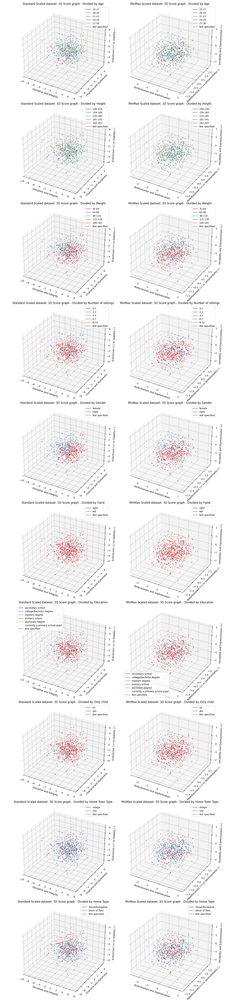

In [179]:
def plot_sg_per_label(ax, Y_reduced, pc_names, labelScaler, label, colorLegend, color_label_column):
    genpos_colors_legend = [Line2D([0], [0], color=colorLegend[k]) for k in colorLegend.keys()]
    ax.scatter(Y_reduced[:, 0], Y_reduced[:, 1], Y_reduced[:, 2], c=X_df[color_label_column], s=5)
    ax.set_title(f'{labelScaler}: 3D Score graph - Divided by {label}')
    ax.set_xlabel(pc_names[0])
    ax.set_ylabel(pc_names[1])
    ax.set_zlabel(pc_names[2])
    ax.legend(genpos_colors_legend, [k for k in colorLegend.keys()])
    ax.grid()

rows = len(labels)
cols = 2

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows), subplot_kw={'projection': '3d'})
axes = axes.flatten()

current_index = 0

for i, label in enumerate(labels):
    colorLegend = legend_colors[i]
    color_label_column = f"color-{label}"
    
    plot_sg_per_label(axes[current_index], Ystd_reduced, pc_std_names, labelStandard, label, colorLegend, color_label_column)
    current_index += 1

    plot_sg_per_label(axes[current_index], Ymm_reduced, pc_mm_names, labelMinMax, label, colorLegend, color_label_column)
    current_index += 1

plt.tight_layout()
plt.show()

Some labels, such as the number of siblings, dominant hand, or education level, do not seem to represent meaningful differentiating factors, likely because the people who are interviewed share similar ages, lifestyles, and comparable backgrounds. As a result, in the graphs divided by nearly all labels, including age and number of siblings, no significant trends emerge concerning the first three Principal Components.

However, the label related to **gender** deserves closer attention: in the graphs of the Standard Scaler, females tend to appear more disciplined and diligent compared to males. In the graphs of the MinMax Scaler, women seem slightly more sentimental and altruistic, while men come across as more rebellious and nonconformist. Additionally, girls appear to be more perfectionist and sophisticated.

## Exercise 4. $k$-Means

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), run the $k$-Means for clustering the data. In particular, **use the silohuette score for identify the best value for $k\in\{3, \ldots, 10\}$**.
2. Plot the score graphs of exercise 3.3, adding the centroids of the cluster.
3. Observing the centroids coordinates in the PC space, **give a name/interpretation to them**, exploiting the names you assigned to the PCs. **Comment and motivate your interpretations**.

In the next cell we run the $k$-Means algorithm to identify the best value of $k$ based on the silhouette score.

In [180]:
def best_silcoeff_kmeans(Y):
    km_list = []
    silcoeff_list = []
    k_list = list(range(3, 11))

    for i in range(len(k_list)):
        km_list.append(KMeans(n_clusters=k_list[i], random_state=20241225))  
        km = km_list[i]
        km.fit(Y)
        silcoeff_list.append(silhouette_score(Y, km.predict(Y))) 

    i_best = np.argmax(silcoeff_list) 
    k = k_list[i_best]
    km = km_list[i_best]

    print(f'Best silhouette score: {np.max(silcoeff_list)} (k = {k})') 
    return k, km, silcoeff_list

**STANDARD SCALER DATASET**

In [181]:
k_std, kmeans_std, silcoeff_list_std = best_silcoeff_kmeans(Ystd_reduced)

Best silhouette score: 0.15744117045754524 (k = 3)


**MINMAX SCALER DATASET**

In [182]:
k_mm, kmeans_mm, silcoeff_list_mm = best_silcoeff_kmeans(Ymm_reduced)

Best silhouette score: 0.16449779352047225 (k = 3)


For both datasets the best value of $k$ is $3$, that is going to be the number of clusters in which we will divide the data. Here is the score graphs for the two datasets divided in $3$ clusters with their respective centroids.

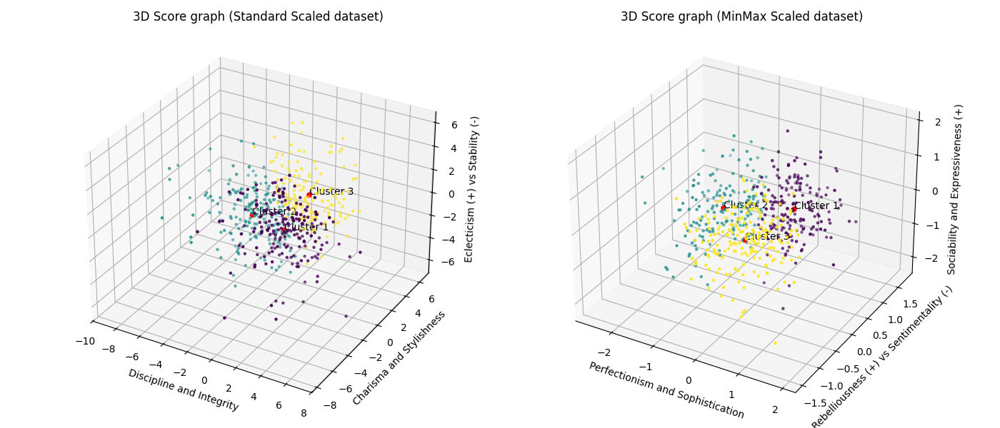

In [183]:
def plot_clusters(ax, df, km, k, names, label):
    ax.scatter(df[:,0],df[:,1],df[:,2], s=5,c=km.labels_)
    ax.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],km.cluster_centers_[:,2], s=20, c = 'red', alpha = 1)
    for kk in range(k):
        ax.text(km.cluster_centers_[kk, 0], km.cluster_centers_[kk, 1], km.cluster_centers_[kk, 2], f'Cluster {kk + 1}')

    ax.set_title(f'3D Score graph ({label})')
    ax.set_xlabel(names[0])
    ax.set_ylabel(names[1])
    ax.set_zlabel(names[2])

fig = plt.figure(figsize=(14, 6))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

plot_clusters(ax1, Ystd_reduced, kmeans_std, k_std, pc_std_names, labelStandard)
plot_clusters(ax2, Ymm_reduced, kmeans_mm, k_mm, pc_mm_names, labelMinMax)

plt.tight_layout()
plt.show()

This function visualizes the centroids in the PC-space as bar plots, comparing the centroid values with the maximum and minimum values of the Principal Components to highlight the relative position of each cluster.

In [184]:
def barplot_centroids(Y_reduced, km, pc_names, label):
    maxs_y = Y_reduced.max(axis=0)
    mins_y = Y_reduced.min(axis=0) 

    fig_centroids, ax_centroids = plt.subplots(1, 3, figsize=(14, 7))
    for ii in range(3):
        ax_centroids[ii].bar(np.arange(km.cluster_centers_.shape[1]), maxs_y, color='blue', alpha=0.15)
        ax_centroids[ii].bar(np.arange(km.cluster_centers_.shape[1]), mins_y, color='blue', alpha=0.15)
        ax_centroids[ii].bar(np.arange(km.cluster_centers_.shape[1]), km.cluster_centers_[ii,:])
        ax_centroids[ii].set_xticks(ticks=np.arange(km.cluster_centers_.shape[1]), labels=pc_names, rotation=90, fontsize=8)
        ax_centroids[ii].set_title(f"{label}: Cluster {ii +1}")
        ax_centroids[ii].grid()
    plt.tight_layout()

**STANDARD SCALER DATASET**

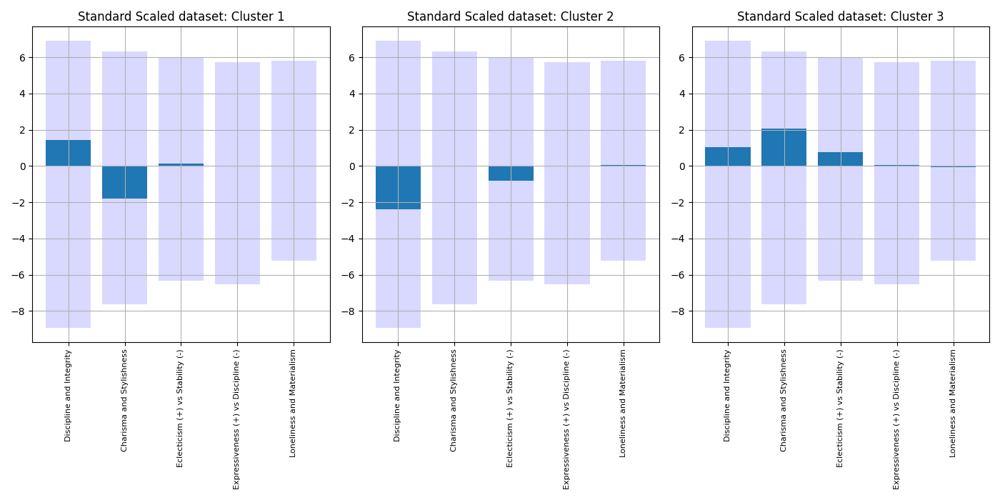

In [185]:
barplot_centroids(Ystd_reduced, kmeans_std, pc_std_names, labelStandard)

- **_Centroid 1_**: The first cluster represents individuals who are **disciplined** yet **lack charisma**, displaying responsibility while showing no interest in appearance or material possessions.
- **_Centroid 2_**: The second cluster is made of individuals that are **irresponsible** and **careless**, yet show traits of confidence and stability.
- **_Centroid 3_**: The third cluster reflects an individual who is **charismatic** and **conscientious**, with emotional stability and a focus of personal style.

In [186]:
cluster_names_std = ["Cluster 1: Disciplined and Apathetic",
                    "Cluster 2: Irresponsible and Confident",
                    "Cluster 3: Charismatic and Conscientious"]

**MINMAX SCALER DATASET**

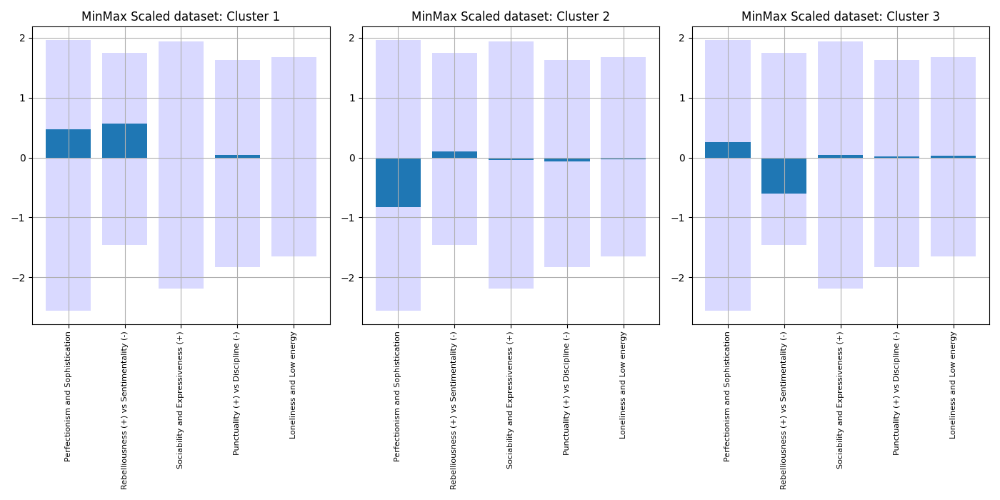

In [187]:
barplot_centroids(Ymm_reduced, kmeans_mm, pc_mm_names, labelMinMax)

- **_Centroid 1_**: The first cluster is characterized by individuals who are **perfectionist** and **alternative**, focused on work while showing a lack in sentimentality.
- **_Centroid 2_**: The second cluster highlights an individual that is **unreliable** and **lazy**, showing some tendencies toward introversion.
- **_Centroid 3_**: The third cluster is defined by individuals that are **organized** and **caring**, with strong emotional expressiveness and a keen attention to detail.

In [188]:
cluster_names_mm = ["Cluster 1: Perfectionist and Detached",
                    "Cluster 2: Unreliable and Lazy",
                    "Cluster 3: Organized and Caring"]

## Exercise 5. Cluster Evaluations

In the cells below, do the following operations:
1. For each one of the two datasets (_std_ and _mm_), perform an **external evaluation** of the clustering obtained at exercise 4.1 with respect to one or more labels in the list _labels_. **Comment the results, comparing the evaluation with the interpretation you gave at exercise 4.3**. 
2. For each one of the two datasets (_std_ and _mm_), perform an **internal evaluation** of each cluster, with respect to the silohuette score. **Comment the results**. 

##### External evaluation

To conduct an external evaluation, we examined the distribution of the labels within each of the three clusters for the two scaled dataframes. We found that, with the exception of the **gender** label, all other labels exhibited a similar distribution pattern with each cluster. This outcome was expected, as the distribution of points in the Principal Component space closely reflects the distribution observed within each cluster.

In [189]:
def evaluate_clusters(km, k):
    mask_clusters = [km.labels_ == ii for ii in range(k)]
    for label in labels:
        cluster_label = [
            responses_df.loc[X_df.index, label][mask_clusters[ii]].value_counts().to_dict() 
            for ii in range(k)
        ]
        bin_labels = label_dict[label]
        if type(bin_labels) != list:
            temp_bin_labels = []
            for b in bin_labels:
                if pd.isna(b):
                    b = 'Not specified'
                temp_bin_labels.append(str(b))
            bin_labels = temp_bin_labels
        else:
            for j in range(k):
                for l in bin_labels:
                    start, end = l.split("-") 
                    cluster_label[j][l] = sum(cluster_label[j].get(z,0) for z in range(int(start), int(end)+1))

        maxcount = np.max([max(cluster_label[kk].values()) for kk in range(k)])

        fig_centroids_ext, ax_centroids_ext = plt.subplots(1, 3, figsize=(14, 5))

        for ii in range(k):
            ax_centroids_ext[ii].bar(bin_labels, [cluster_label[ii].get(bb, 0) for bb in bin_labels])
            ax_centroids_ext[ii].set_ylim(0, maxcount)
            ax_centroids_ext[ii].grid(visible=True, which='both')
            ax_centroids_ext[ii].set_title(f'Cluster {ii+1} - {label}')
            if label == 'Education':
                ax_centroids_ext[ii].tick_params(axis='x', rotation=90)
        
        plt.tight_layout()
        plt.show()

**STANDARD SCALER DATASET**

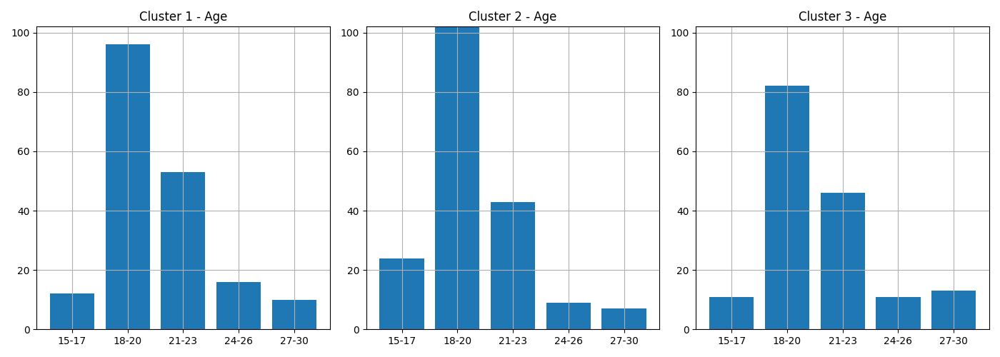

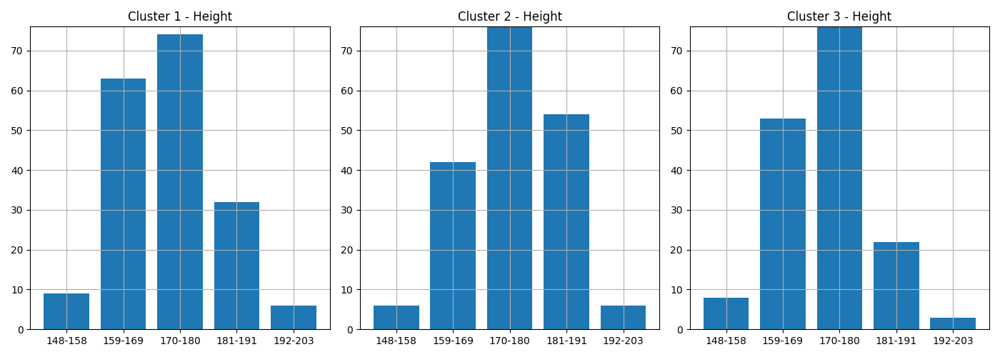

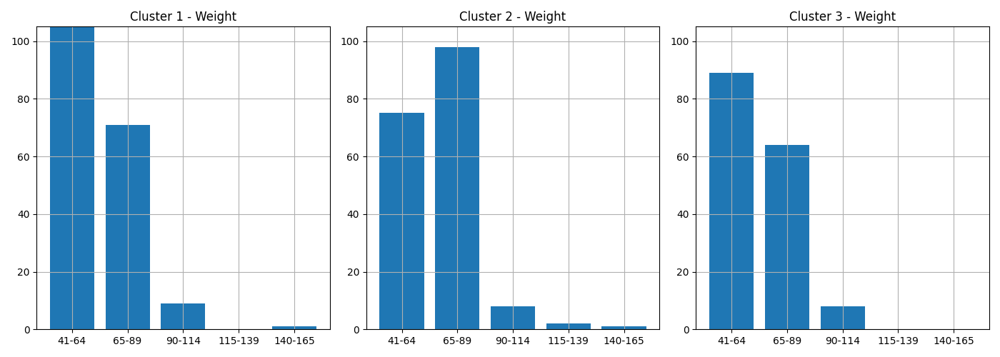

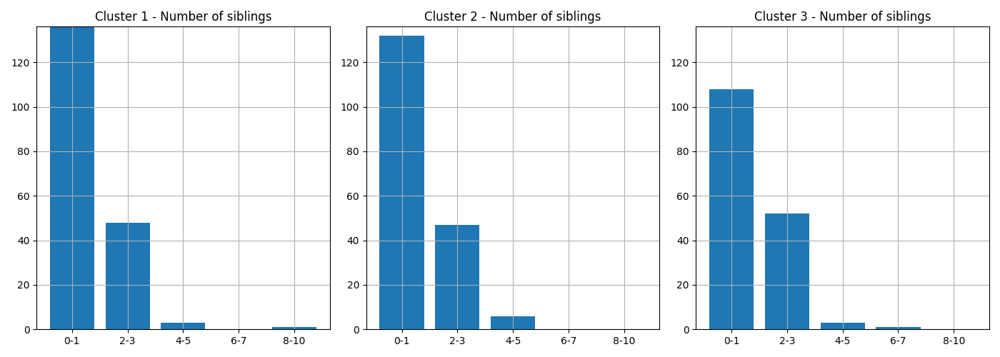

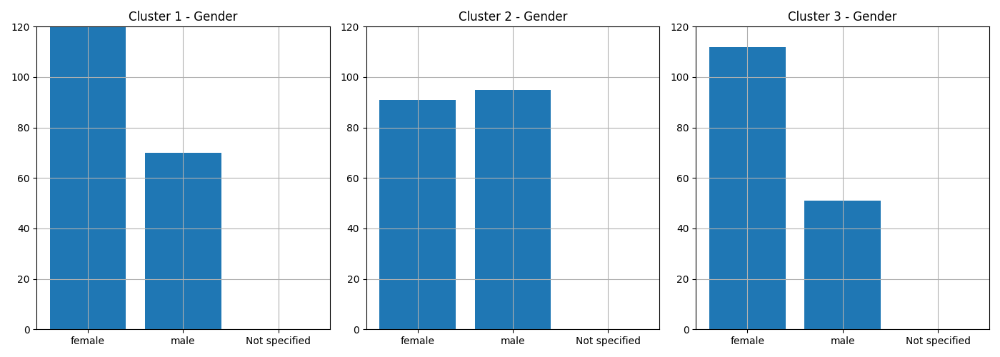

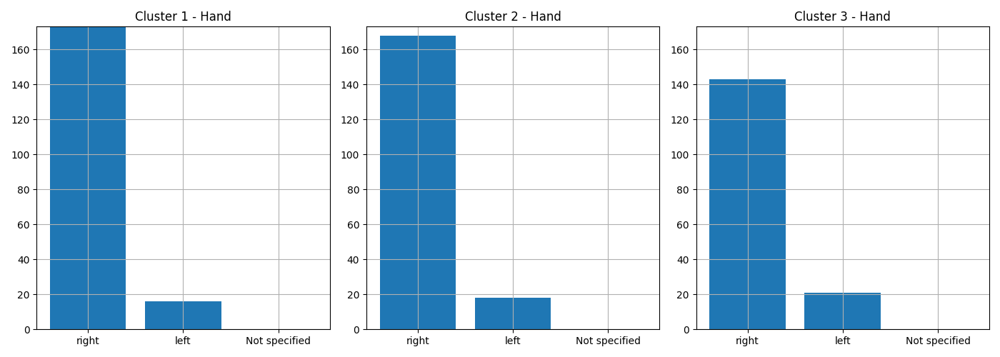

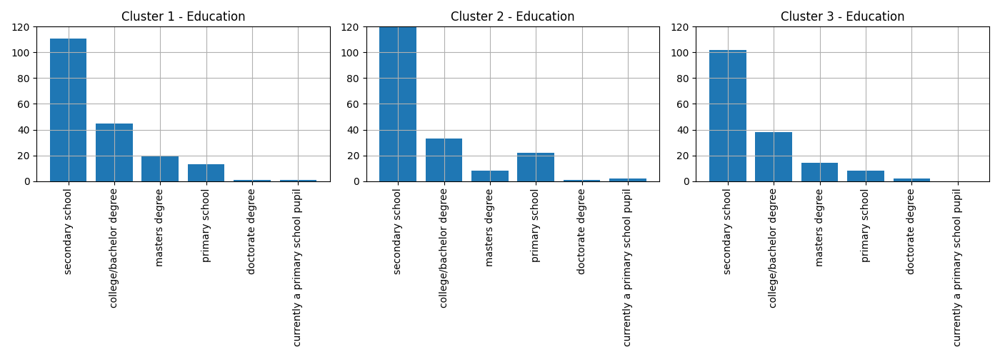

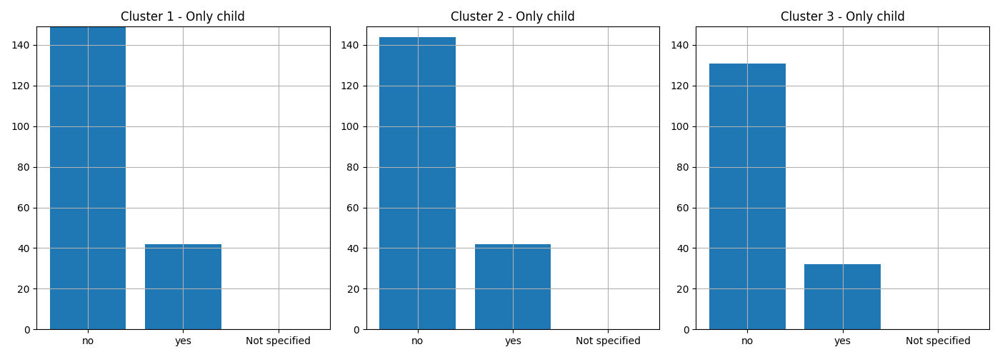

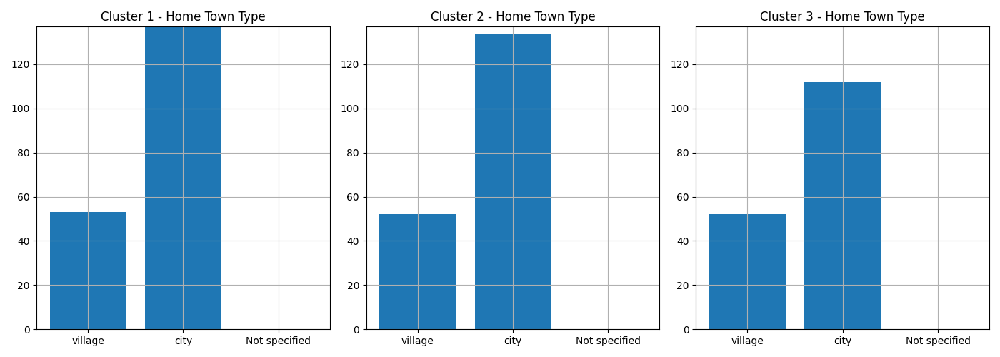

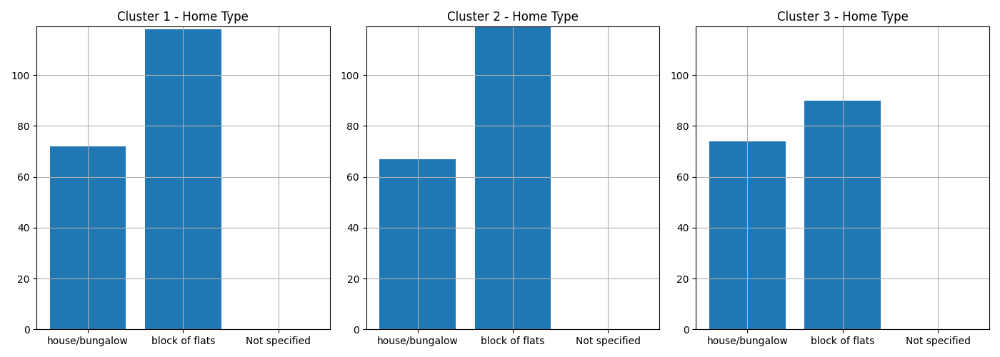

In [190]:
evaluate_clusters(kmeans_std, k_std)

The **gender** label is particularly noteworthy because the points show different distributions between clusters. In particular, while in the second one the number of females is practically the same as the number of males, clusters $1$ and $3$ show a significative majority of women.
This led us to conclude that females tend to be more disciplined and conscientious than males.

**MINMAX SCALER DATASET**

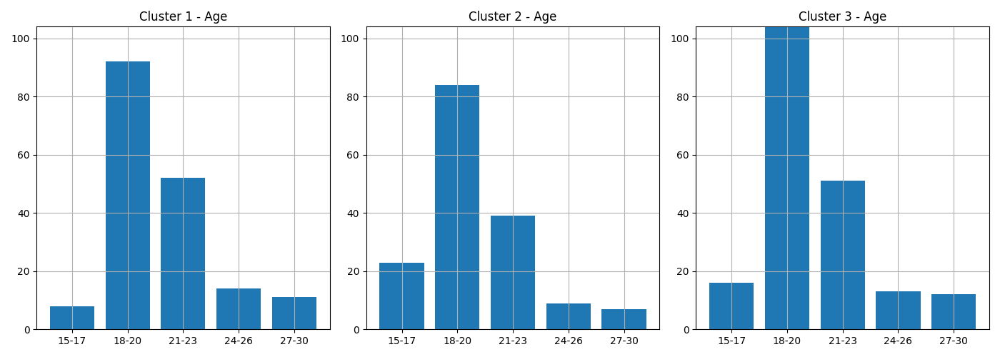

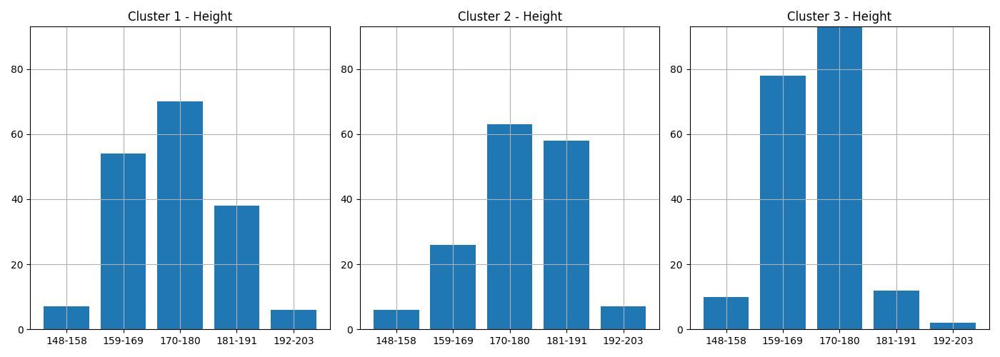

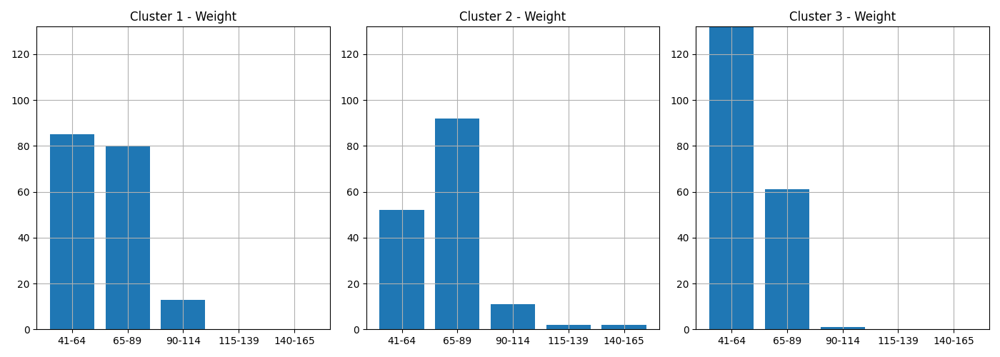

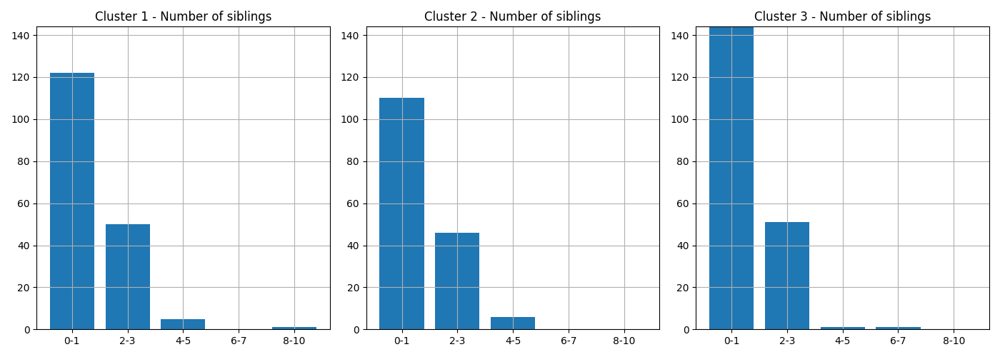

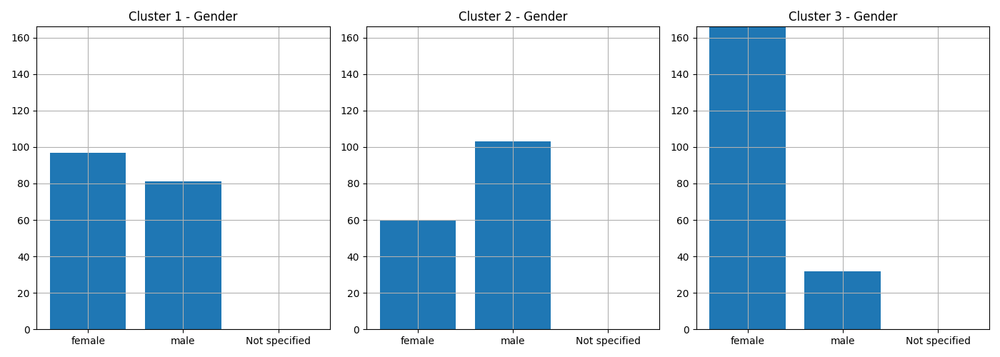

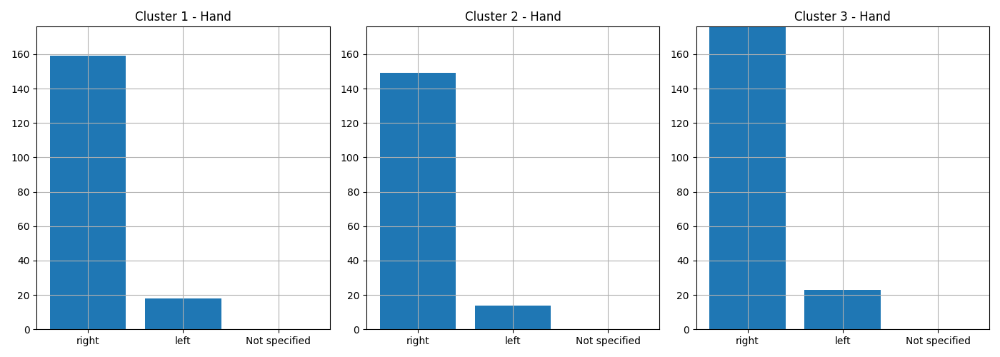

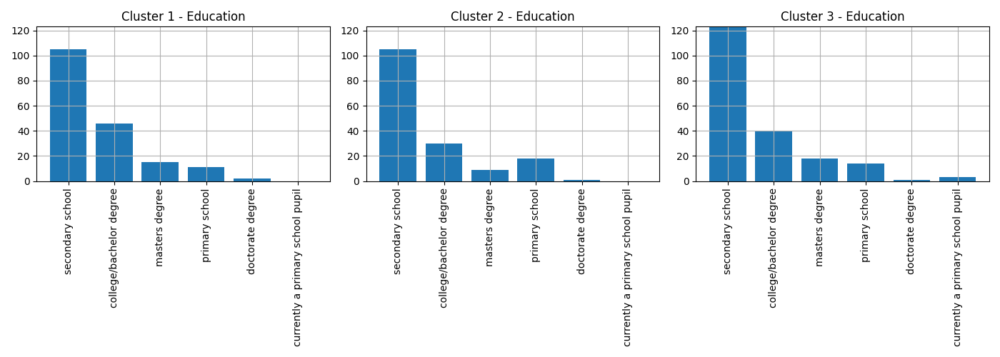

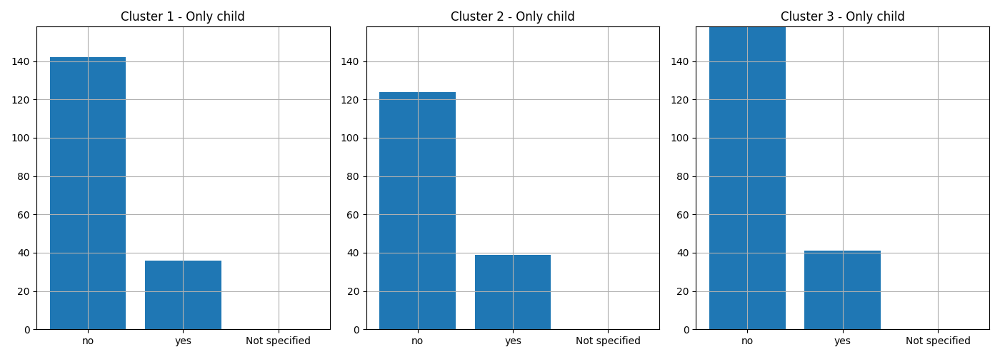

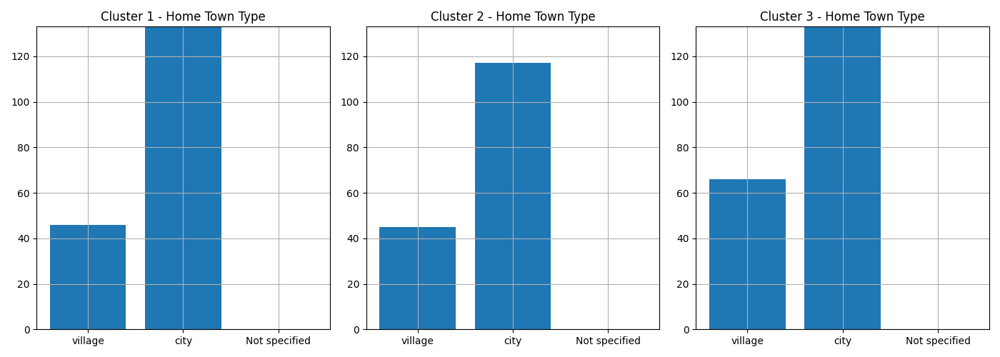

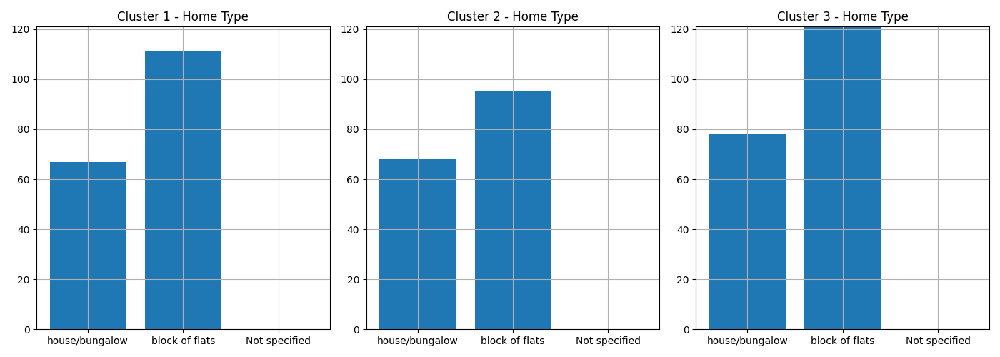

In [191]:
evaluate_clusters(kmeans_mm, k_mm)

The label related to **gender** is interesting due to the distinct distributions across the clusters. Specifically, in the first one there is little  difference in the number of males and females, with a slight majority of the lattest. Cluster $2$ shows a strong male majority and cluster $3$ is almost entirely composed of females. This brings to the conclusion that men tend to be more unreliable and introved than women, whereas females are more organized, empathethic and expressive with their emotions.

##### Internal evaluation

To perform an internal evaluation of the clustering results, we focused on the silhouette scores metric and analyzed how well the $k$-means algorithm has grouped the data under both Standard Scaling and MinMax Scaling.

In [192]:
def display_silcores(Y_reduced, km, k, silcoeff_list, cluster_names):
    silscores = silhouette_samples(Y_reduced, km.labels_)
    clusters_silscore = [np.mean(silscores[km.labels_ == x]) for x in range(k)]
    display(pd.DataFrame(np.array(clusters_silscore + [np.max(silcoeff_list)]), index=cluster_names + ['Global'] , columns=['Silhouette score']))

**STANDARD SCALER DATASET**

In [193]:
display_silcores(Ystd_reduced, kmeans_std, k_std, silcoeff_list_std, cluster_names_std)

,Silhouette score
Cluster 1: Disciplined and Apathetic,0.127170
Cluster 2: Irresponsible and Confident,0.161451
Cluster 3: Charismatic and Conscientious,0.188148
Global,0.157441


- Cluster $1$ has the lowest silhouette score, suggesting that it may have points less well-clustered or more similar to points in other clusters.
- Cluster $3$ has the highest score, indicating it is the best-defined cluster in terms of cohesion and separation from other clusters.

**MINMAX SCALER DATASET**

In [194]:
display_silcores(Ymm_reduced, kmeans_mm, k_mm, silcoeff_list_mm, cluster_names_mm)

,Silhouette score
Cluster 1: Perfectionist and Detached,0.149736
Cluster 2: Unreliable and Lazy,0.168306
Cluster 3: Organized and Caring,0.174657
Global,0.164498


- Cluster $1$ has the lowest score, as the cluster may include points that are more similar to those in other clusters.
- Cluster $3$ has the highest score, showing the best internal consistency among the clusters.

The Silhouette scores are slightly higher for the MinMax Scaled dataset compared to the Standard Scaled dataset, suggesting that the MinMax Scaler may lead to better-defined clusters.

However, the consistently low silhouette scores suggest that the clusters are not well-separated. This could indicate that the features used for clustering are not sufficiently discriminative and relevant.